Emma Witanowski

***


# Part 1: Heat Vulnerability

Libraries + Install any missing packages

In [ ]:
#!pip install census us

from census import Census
from us import states
import geopandas as gpd
import pandas as pd
import glob
import numpy as np
import rioxarray as rxr
import xarray as xr
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from factor_analyzer import FactorAnalyzer, Rotator
import rasterio
from shapely.geometry import box
from scipy import stats
from rasterstats import zonal_stats
from rasterio.merge import merge
import contextily as ctx
from rasterio.features import rasterize
from rasterio.mask import mask
from scipy.ndimage import distance_transform_edt
from shapely.ops import unary_union
from shapely.validation import make_valid
import matplotlib as mpl
import folium
from folium.features import GeoJsonTooltip
import branca.colormap as cm
from branca.colormap import LinearColormap


***

### Census Data (Sociodemographic, Health)

In [70]:
##Code below fetches the ACS Data using an API call + add it with the shapefile to get the geometry


c = Census("da09846fd125d6f2ef8ab7472bcc42cd9f63a45c")  #API KEY
year = 2022 #5-yr estimate

variables = [
    ###Below are all the Yale defined variables ... some didn't work so those are noted out 
    "B01003_001E", #Total Pop
    "B03003_003E", #Hispanic/Latino
    "B03002_004E", #Non-Hispanic/Latino, AfricanAmer/Black
    "B01001_020E", "B01001_021E", "B01001_022E", "B01001_023E", "B01001_024E", "B01001_025E", #Male, Elderly (65+)
    "B01001_044E", "B01001_045E", "B01001_046E", "B01001_047E", "B01001_048E", "B01001_049E", #Female, Elderly (65+)
    "B23025_005E", #Living below the fed poverty level [i.e., total income last 12 months below poverty line]
    "B11001_008E", #Living alone
    "B11007_003E", #Elderly, living alone (i.e., household w/ 1 or more people 65+ - 1 person household)
    #"C18108_001E", #Disabled
    "B15003_002E", "B15003_003E", "B15003_004E", "B15003_005E", "B15003_006E", "B15003_007E", "B15003_008E", "B15003_009E", "B15003_010E", "B15003_011E", "B15003_012E", "B15003_013E", "B15003_014E", "B15003_015E", "B15003_016E", #Less than H.S.
    #"B05002_009E", #Foreign born, not working B05002_013E
    "C16002_004E", "C16002_007E", "C16002_010E", "C16002_013E", #Limited English proficiency
    "B25034_006E", "B25034_007E", "B25034_008E", "B25034_009E", "B25034_010E", "B25034_011E", #House built prior 1980
    "B25034_001E", #Total housing units
    ###Some extra variables that I found interesting/relevant
    #"C18108_003E", #Pop disabled, at least 1 disability - <18 --> MAYBE NOT 
    #"C18108_011E", #Pop disabled, at least 1 disability - >65 --> MAYBE NOT 
    "B01001_008E", "B01001_009E", "B01001_010E", "B01001_011E", "B01001_012E", "B01001_013E", "B01001_014E", "B01001_015E", "B01001_016E", "B01001_017E", "B01001_018E", "B01001_019E", "B01001_020E", "B01001_021E", "B01001_022E", "B01001_023E", "B01001_024E", "B01001_025E", #Male, 20+ (for diabetes)
    "B01001_032E", "B01001_033E", "B01001_034E", "B01001_035E", "B01001_036E", "B01001_037E", "B01001_038E", "B01001_039E", "B01001_040E", "B01001_041E", "B01001_042E", "B01001_043E", "B01001_044E", "B01001_045E", "B01001_046E", "B01001_047E", "B01001_048E", "B01001_049E" #Female, 20+ (for diabetes)
]

#####call the data for RI specific (block groups)
data = c.acs5.state_county_blockgroup(
    variables,
    states.RI.fips,     # Rhode Island
    Census.ALL,         # all counties
    Census.ALL          # all block groups
)

df = pd.DataFrame(data)

###Need GEOID to merge with shapefile
df['GEOID'] = df['state'] + df['county'] + df['tract'] + df['block group']

print(df[['GEOID', 'state', 'county', 'tract', 'block group'] + variables].head())

##Had some issues with the API call, so saved it locally 
#df.to_csv("ri_acs_blockgroups.csv", index=False)

          GEOID state county   tract block group  B01003_001E  B03003_003E  \
0  440010301001    44    001  030100           1       1256.0        208.0   
1  440010301002    44    001  030100           2       1114.0         91.0   
2  440010301003    44    001  030100           3       1252.0         26.0   
3  440010301004    44    001  030100           4       1348.0        182.0   
4  440010302001    44    001  030200           1        957.0        153.0   

   B03002_004E  B01001_020E  B01001_021E  ...  B01001_040E  B01001_041E  \
0          0.0         51.0          0.0  ...         72.0         19.0   
1          0.0         11.0         30.0  ...         36.0         59.0   
2          3.0         50.0         18.0  ...         92.0         48.0   
3          0.0         11.0          0.0  ...        145.0         25.0   
4         32.0         11.0         17.0  ...         71.0          9.0   

   B01001_042E  B01001_043E  B01001_044E  B01001_045E  B01001_046E  \
0         

<Axes: >

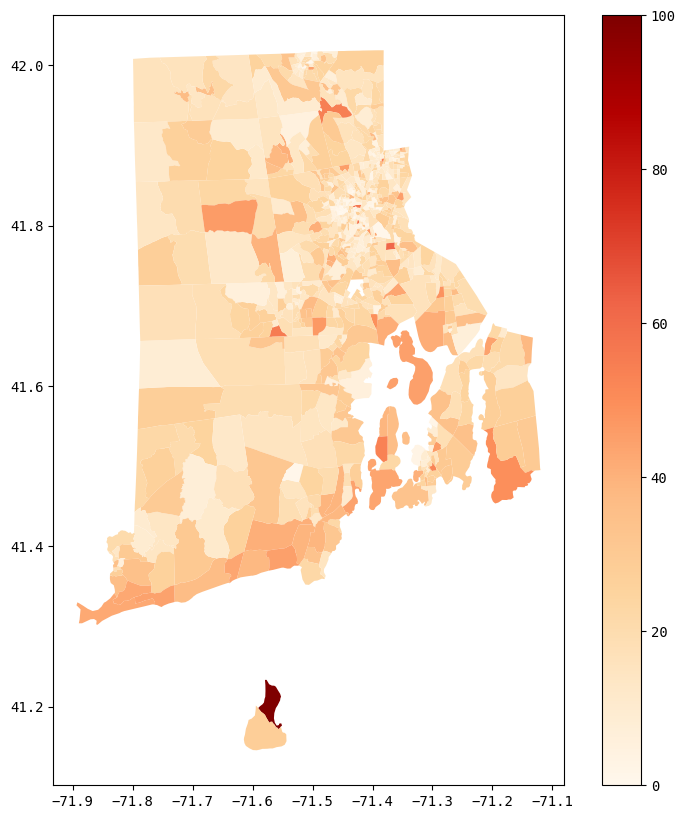

In [76]:
#RI Block Groups Shapefile (from ACS Tiger)
ri_bg = gpd.read_file("/Users/emmawit/Downloads/SpatialDataSci_Final_Data_EW/tl_2022_44_bg/tl_2022_44_bg.shp")
diabetes = pd.read_csv("/Users/emmawit/Downloads/SpatialDataSci_Final_Data_EW/cdc_diabetes_5yr_avg.csv")

###########

#merging the shapefile and variables
ri_acs = ri_bg.merge(df, on='GEOID', how='left')

#Calculating all the percentages
ri_acs['pct_latino'] = ri_acs['B03003_003E'].astype(float) / ri_acs['B01003_001E'].astype(float) * 100
ri_acs['pct_black'] = ri_acs['B03002_004E'].astype(float) / ri_acs['B01003_001E'].astype(float) * 100
ri_acs['pct_poverty'] = ri_acs['B23025_005E'].astype(float) / ri_acs['B01003_001E'].astype(float) * 100
ri_acs['pct_live_alone'] = ri_acs['B11001_008E'].astype(float) / ri_acs['B01003_001E'].astype(float) * 100
ri_acs['pct_live_alone_elderly'] = ri_acs['B11007_003E'].astype(float) / ri_acs['B01003_001E'].astype(float) * 100
#ri_acs['pct_disabled'] = ri_acs['C18108_001E'].astype(float) / ri_acs['B01003_001E'].astype(float) * 100
#ri_acs['pct_foreign_born'] = ri_acs['B05002_009E'].astype(float) / ri_acs['B01003_001E'].astype(float) * 100
ri_acs['pct_total_housing'] = ri_acs['B25034_001E'].astype(float) / ri_acs['B01003_001E'].astype(float) * 100
#ri_acs['pct_disabled_1dis_18_less'] = ri_acs['C18108_003E'].astype(float) / ri_acs['B01003_001E'].astype(float) * 100
#ri_acs['pct_disabled_1dis_65_more'] = ri_acs['C18108_011E'].astype(float) / ri_acs['B01003_001E'].astype(float) * 100
ri_acs['pct_less_hs'] = (
    ri_acs[[
        "B15003_002E","B15003_003E","B15003_004E","B15003_005E",
        "B15003_006E","B15003_007E","B15003_008E","B15003_009E",
        "B15003_010E","B15003_011E","B15003_012E","B15003_013E",
        "B15003_014E","B15003_015E","B15003_016E"
    ]].astype(float).sum(axis=1) 
    / ri_acs['B01003_001E'].astype(float) * 100
)
ri_acs['pct_elderly'] = (ri_acs[["B01001_020E","B01001_021E","B01001_022E","B01001_023E","B01001_024E","B01001_025E",  #for male 65+
                                 "B01001_044E","B01001_045E","B01001_046E","B01001_047E","B01001_048E","B01001_049E"   #for female 65+
                                ]].astype(float).sum(axis=1) / ri_acs["B01003_001E"].astype(float) * 100)

ri_acs['pct_limited_english'] = (ri_acs[["C16002_004E", "C16002_007E", "C16002_010E", "C16002_013E"]].astype(float).sum(axis=1) / ri_acs["B01003_001E"].astype(float) * 100)

ri_acs['pct_pre1980'] = (ri_acs[["B25034_006E", "B25034_007E", "B25034_008E", "B25034_009E", "B25034_010E"]].astype(float).sum(axis=1) / ri_acs["B25034_001E"].astype(float) * 100)

ri_acs["male20plus_total"] = ri_acs[
    [
     "B01001_008E","B01001_009E","B01001_010E","B01001_011E","B01001_012E","B01001_013E",
     "B01001_014E","B01001_015E","B01001_016E","B01001_017E","B01001_018E","B01001_019E",
     "B01001_020E","B01001_021E","B01001_022E","B01001_023E","B01001_024E","B01001_025E"]
].astype(float).sum(axis=1)

ri_acs["female20plus_total"] = ri_acs[
    [
     "B01001_032E","B01001_033E","B01001_034E","B01001_035E","B01001_036E","B01001_037E",
     "B01001_038E","B01001_039E","B01001_040E","B01001_041E","B01001_042E","B01001_043E",
     "B01001_044E","B01001_045E","B01001_046E","B01001_047E","B01001_048E","B01001_049E"]
].astype(float).sum(axis=1)

ri_acs["totalpop_20plus"] = ri_acs[
    ["B01001_008E","B01001_009E","B01001_010E","B01001_011E","B01001_012E","B01001_013E","B01001_014E","B01001_015E",
     "B01001_016E","B01001_017E","B01001_018E","B01001_019E","B01001_020E","B01001_021E","B01001_022E","B01001_023E",
     "B01001_024E","B01001_025E",
     "B01001_032E","B01001_033E","B01001_034E","B01001_035E","B01001_036E","B01001_037E","B01001_038E","B01001_039E",
     "B01001_040E","B01001_041E","B01001_042E","B01001_043E","B01001_044E","B01001_045E","B01001_046E","B01001_047E",
     "B01001_048E","B01001_049E"
    ]
].astype(float).sum(axis=1)

ri_acs["COUNTYFP"] = ri_acs["COUNTYFP"].astype(str).str.zfill(3)
diabetes["COUNTYFP"] = diabetes["COUNTYFP"].astype(str).str.zfill(3)

ri_acs = ri_acs.merge(
    diabetes[["COUNTYFP", "MALE_5YR_AVG", "FEMALE_5YR_AVG"]],
    on="COUNTYFP",
    how="left"
)

ri_acs["MALE_5YR_AVG"] = ri_acs["MALE_5YR_AVG"].astype(float) / 100
ri_acs["FEMALE_5YR_AVG"] = ri_acs["FEMALE_5YR_AVG"].astype(float) / 100

ri_acs["male_diab"] = ri_acs["MALE_5YR_AVG"].astype(float) * ri_acs["male20plus_total"]
ri_acs["female_diab"] = ri_acs["FEMALE_5YR_AVG"].astype(float) * ri_acs["female20plus_total"]
ri_acs["diabetes_estimated_total"] = (ri_acs["male_diab"] + ri_acs["female_diab"])

# Diabetes rate (percent) among 20+ population
ri_acs["dia_pct_total"] = (ri_acs["diabetes_estimated_total"] / ri_acs["totalpop_20plus"] * 100)

ri_acs[ri_acs["dia_pct_total"].isna()]
ri_acs["dia_pct_total"] = ri_acs["dia_pct_total"].fillna(0)

#Sample plot just to see the data spatially
ri_acs.plot(column='pct_elderly', cmap='OrRd', legend=True, figsize=(10,10))

***

### Temperature Data

Saved: /Users/emmawit/Downloads/Daymet_Summer_v2/daymet_mean_5yrs.tif


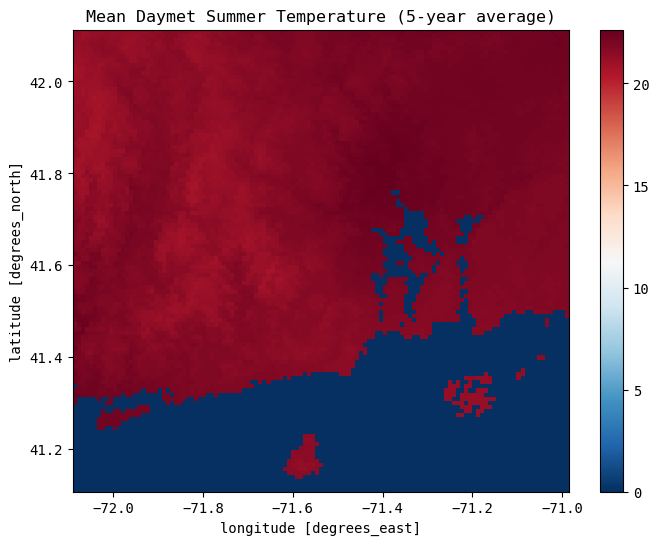

In [77]:
###have the summer month mean temps from Daymet ... saved as tif files ... grabbing them and doing a perpixel mean

summer_temp_folder = "/Users/emmawit/Downloads/Daymet_Summer_v2"
tif_files = sorted(glob.glob(summer_temp_folder + "/*.tif"))

arrays = [rxr.open_rasterio(f).squeeze() for f in tif_files]

arrays_aligned = [arr.rio.reproject_match(arrays[0]) for arr in arrays]

stack = xr.concat(arrays_aligned, dim="time")

mean_da = stack.mean(dim="time", skipna=True)

mean_da.rio.to_raster(summer_temp_folder + "/daymet_mean_5yrs.tif")
print("Saved:", summer_temp_folder + "/daymet_mean_5yrs.tif")

########
plt.figure(figsize=(8,6))
mean_da.plot(cmap="RdBu_r")
plt.title("Mean Daymet Summer Temperature (5-year average)")
plt.show()

In [10]:
print(ri_acs.crs)

import rasterio
with rasterio.open("/Users/emmawit/Downloads/Daymet_Summer_v2/daymet_mean_5yrs.tif") as src:
    print(src.crs)

ri_acs = ri_acs.to_crs("EPSG:4326")
print(ri_acs.crs)

EPSG:4326
EPSG:4326
EPSG:4326


/opt/anaconda3/envs/geospatial/lib/python3.12/site-packages/rasterstats/io.py:335: NodataWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn(


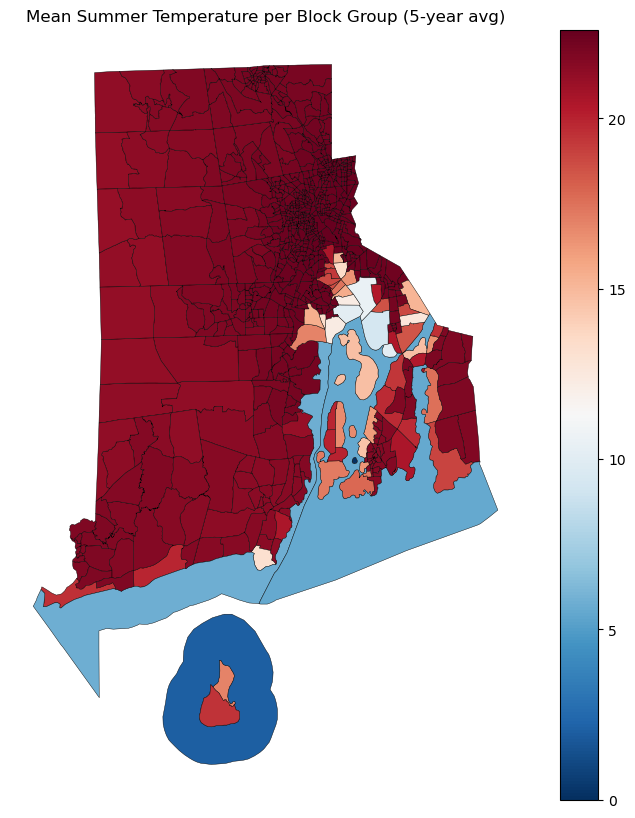

In [ ]:

raster_path = "/Users/emmawit/Downloads/Daymet_Summer_v2/daymet_mean_5yrs.tif"
with rasterio.open(raster_path) as src:
    bounds = src.bounds
    ras_crs = src.crs

raster_box = box(bounds.left, bounds.bottom, bounds.right, bounds.top)
raster_gdf = gpd.GeoDataFrame({"geometry": [raster_box]}, crs=ras_crs)

ri_acs_clip = ri_acs[ri_acs.intersects(raster_box)]

from rasterstats import zonal_stats

zs1 = zonal_stats(
    ri_acs_clip,
    raster_path,
    stats=["mean"],
    all_touched=True,
    geojson_out=False
)

ri_acs_clip["tmean_5yr"] = [z["mean"] for z in zs1]

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ri_acs_clip.plot(
    column="tmean_5yr",     
    ax=ax,
    cmap="RdBu_r",          
    legend=True,
    edgecolor="black",
    linewidth=0.3
)

ax.set_title("Mean Summer Temperature per Block Group (5-year avg)")
ax.set_axis_off() 
plt.show()

idk if i need this?

In [84]:
import rasterio
from shapely.geometry import box
import geopandas as gpd

# Open raster
raster_path = "/Users/emmawit/Downloads/Daymet_Summer_v2/daymet_mean_5yrs.tif"
with rasterio.open(raster_path) as src:
    bounds = src.bounds
    ras_crs = src.crs

# Create a polygon of raster extent
raster_box = box(bounds.left, bounds.bottom, bounds.right, bounds.top)
raster_gdf = gpd.GeoDataFrame({"geometry": [raster_box]}, crs=ras_crs)

ri_acs_clip = ri_acs[ri_acs.intersects(raster_box)]

print(len(ri_acs), "original BGs")
print(len(ri_acs_clip), "BGs overlapping raster")

792 original BGs
792 BGs overlapping raster


In [78]:
###calculate the dayment mode for the months/years ... turn into 2d array, calculate per-pixel mode, and save the output raster just in case

daymet_folder = "/Users/emmawit/Downloads/Daymet_Avg/"
daymet_raster_files = sorted(glob.glob(daymet_folder + "Daymet_*_*.tmean.tif"))

with rasterio.open(daymet_raster_files[0]) as src:
    meta = src.meta.copy()
    height, width = src.height, src.width

data_stack = np.empty((len(daymet_raster_files), height, width), dtype=np.float32)

for i, f in enumerate(daymet_raster_files):
    with rasterio.open(f) as src:
        data = src.read(1)
        data_stack[i, :, :] = data


mode_array, _ = stats.mode(data_stack, axis=0, nan_policy='omit')
mode_array = np.squeeze(mode_array)

meta.update(dtype=rasterio.float32, count=1)
output_daymet = "/Users/emmawit/Downloads/Daymet_Avg/daymet_tmean_mode.tif"

with rasterio.open(output_daymet, 'w', **meta) as dst:
    dst.write(mode_array, 1)

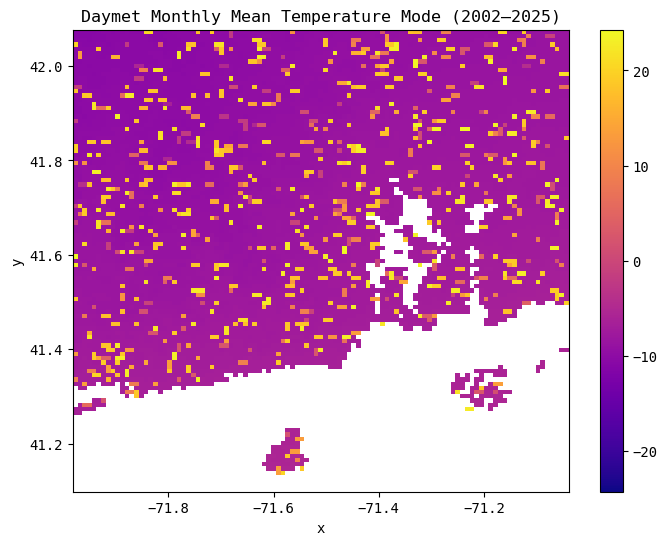

In [79]:
##test plot just to see how the mode temp looks like ... 
mode_da = rioxarray.open_rasterio(output_daymet, masked=True)
mode_da = mode_da.sel(band=1)

plt.figure(figsize=(8,6))
mode_da.plot(cmap="plasma") 
plt.title("Daymet Monthly Mean Temperature Mode (2002–2025)")
plt.show()

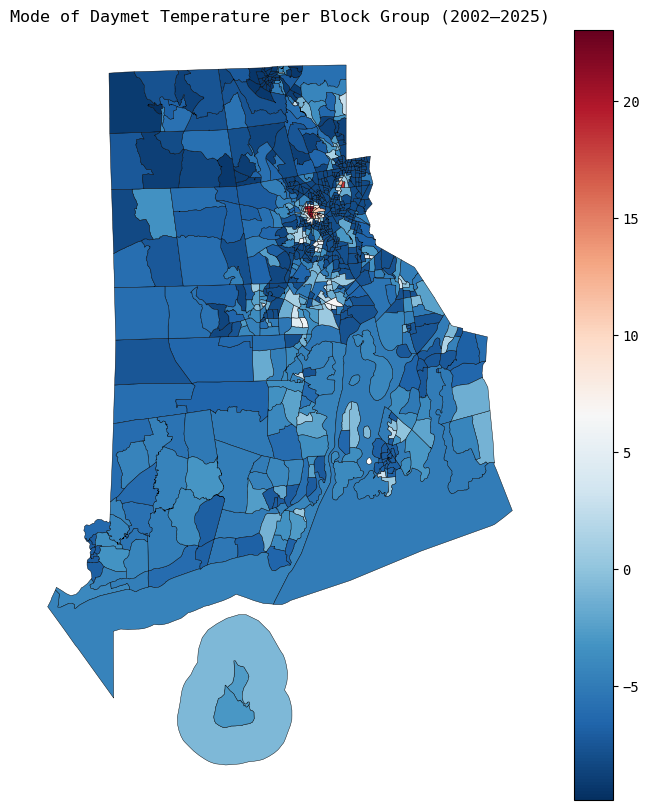

In [ ]:
###now doing the calculation per census track ... just seeing if the caculation works 
with rasterio.open(output_daymet) as src:
    bounds = src.bounds
    ras_crs = src.crs

raster_box = box(bounds.left, bounds.bottom, bounds.right, bounds.top)
raster_gdf = gpd.GeoDataFrame({"geometry": [raster_box]}, crs=ras_crs)

ri_acs_clip = ri_acs[ri_acs.intersects(raster_box)].copy()

zs_mode = zonal_stats(
    ri_acs_clip,
    output_daymet,
    stats=["mean"],
    all_touched=True,
    geojson_out=False
)

ri_acs_clip["tmean_mode"] = [z["mean"] for z in zs_mode]

################
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ri_acs_clip.plot(
    column="tmean_mode",
    ax=ax,
    cmap="RdBu_r",
    legend=True,
    edgecolor="black",
    linewidth=0.3
)
ax.set_title("Mode of Daymet Temperature per Block Group (2002–2025)")
ax.set_axis_off()
plt.show()

In [81]:
##ok since the above calculation work ... going to do it again ... bc it was not merging properly 
raster_path_5yr = "/Users/emmawit/Downloads/Daymet_Summer_v2/daymet_mean_5yrs.tif"
with rasterio.open(raster_path_5yr) as src:
    bounds_5yr = src.bounds
    ras_crs = src.crs

raster_box_5yr = box(bounds_5yr.left, bounds_5yr.bottom, bounds_5yr.right, bounds_5yr.top)
ri_acs_clip = ri_acs[ri_acs.intersects(raster_box_5yr)].copy()

zs1 = zonal_stats(
    ri_acs_clip,
    raster_path_5yr,
    stats=["mean"],
    all_touched=True,
    geojson_out=False
)
ri_acs_clip["tmean_5yr"] = [z["mean"] for z in zs1]

raster_path_mode = "/Users/emmawit/Downloads/Daymet_Avg/daymet_tmean_mode.tif"
zs_mode = zonal_stats(
    ri_acs_clip,
    raster_path_mode,
    stats=["mean"],
    all_touched=True,
    geojson_out=False
)
ri_acs_clip["tmean_mode"] = [z["mean"] for z in zs_mode]

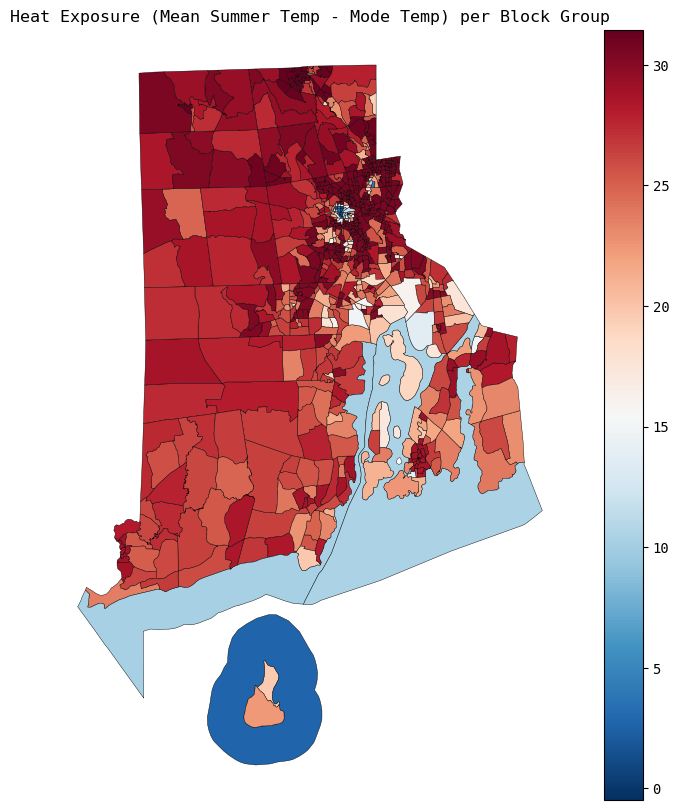

In [82]:
##NOW CALCULATE THE HEAT EXPOSURE METRIC
ri_acs_clip["heat_exposure"] = ri_acs_clip["tmean_5yr"] - ri_acs_clip["tmean_mode"]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ri_acs_clip.plot(
    column="heat_exposure",
    ax=ax,
    cmap="RdBu_r",
    legend=True,
    edgecolor="black",
    linewidth=0.3
)
ax.set_title("Heat Exposure (Mean Summer Temp - Mode Temp) per Block Group")
ax.set_axis_off()
plt.show()

***

### Landcover

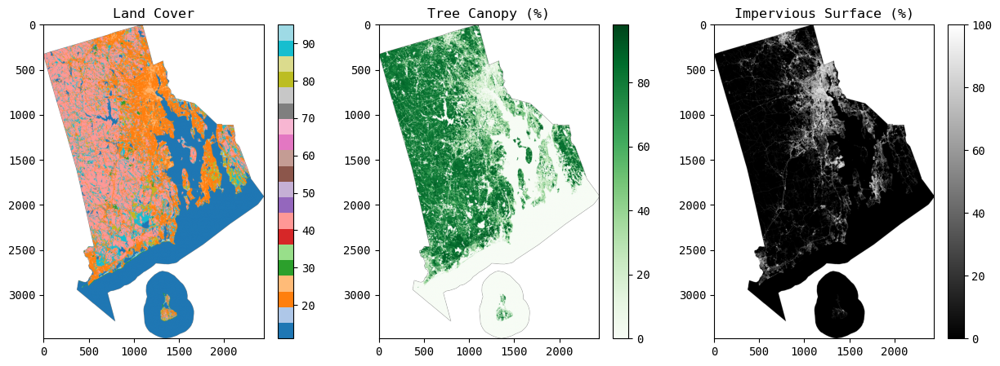

In [118]:
###Landcover variables, all from the NLDC

landcover = '/Users/emmawit/Downloads/SpatialDataSci_Final_Data_EW/Landcover_RI.tif'
with rasterio.open(landcover) as src:
    landcover = src.read(1)
    lc_transform = src.transform
    lc_crs = src.crs
lc_classes = [11, 12, 21, 22, 23, 24, 31, 41, 42, 43, 52, 71, 81, 82, 90, 95] ###need to remove all the nan values
landcover = np.where(np.isin(landcover, lc_classes), landcover, np.nan)
###########
tree_canopy = '/Users/emmawit/Downloads/SpatialDataSci_Final_Data_EW/TreeCanopy_RI.tif'
with rasterio.open(tree_canopy) as src:
    tree_canopy = src.read(1)
    tc_transform = src.transform
    tc_crs = src.crs
tree_canopy = np.where(tree_canopy > 100, np.nan, tree_canopy) ##remove any weird values
###########
imp_surf = '/Users/emmawit/Downloads/SpatialDataSci_Final_Data_EW/ImpSurf_RI.tif'
with rasterio.open(imp_surf) as src:
    imp_surf = src.read(1)
    imp_transform = src.transform
    imp_crs = src.crs
imp_surf = np.where(imp_surf > 100, np.nan, imp_surf) ##remove any weird values

#########quick plots
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(landcover, cmap='tab20')
plt.title("Land Cover")
plt.colorbar()

plt.subplot(1,3,2)
plt.imshow(tree_canopy, cmap='Greens')
plt.title("Tree Canopy (%)")
plt.colorbar()

plt.subplot(1,3,3)
plt.imshow(imp_surf, cmap='gray')
plt.title("Impervious Surface (%)")
plt.colorbar()

plt.show()

In [119]:
##make sure the crs match up
ri_acs_clip = ri_acs_clip.to_crs(imp_crs)

##mean impervious surface per block
s = zonal_stats(
    ri_acs_clip,
    imp_surf,              
    affine=imp_transform,  
    stats=["mean"],
    nodata=np.nan,         
    all_touched=True,
    geojson_out=False
)

ri_acs_clip["impervious_avg"] = [z["mean"] for z in s]

print(ri_acs_clip[["GEOID", "impervious_avg"]].head())

###########

##mean tree canopy per block
zs = zonal_stats(
    ri_acs_clip,
    tree_canopy,          
    affine=tc_transform,    
    stats=["mean"],
    nodata=np.nan,        
    all_touched=True,
    geojson_out=False
)

ri_acs_clip["treecanopy_avg"] = [z["mean"] for z in zs]

##see the first couple to check if it worked
print(ri_acs_clip[["GEOID", "treecanopy_avg"]].head())

          GEOID  impervious_avg
0  440090505002        1.118522
1  440090501032       45.568805
2  440090505003        2.599455
3  440090509011        7.903334
4  440090505001        2.408158
          GEOID  treecanopy_avg
0  440090505002       74.671084
1  440090501032       15.881034
2  440090505003       69.232941
3  440090509011       61.334663
4  440090505001       66.062884


In [ ]:
###calculating percent of high density (i.e., value 24)
zs_lc24 = zonal_stats(
    ri_acs_clip,               
    landcover,           
    affine=lc_transform,  
    stats=["sum", "count"], 
    categorical=True,    
    all_touched=True,
    nodata=np.nan,
    geojson_out=False
)

pct_lc24 = []
for z in zs_lc24:
    valid_counts = [v for k,v in z.items() if k != 'nodata' and v is not None]
    total_pixels = sum(valid_counts)
    class24_pixels = z.get(24, 0) or 0  
    pct_lc24.append((class24_pixels / total_pixels) * 100 if total_pixels > 0 else np.nan)

ri_acs_clip["pct_lc24"] = pct_lc24

ri_acs_clip[["GEOID", "pct_lc24"]].head()

,GEOID,pct_lc24
0,440090505002,0.000268
1,440090501032,1.089027
2,440090505003,0.004772
3,440090509011,0.006285
4,440090505001,0.001711


In [123]:
##all the values that are deemed 'green space'
non_green_classes = [11, 12, 21, 22, 23, 24, 31, 51, 72, 73, 74]

zs_nongreen = zonal_stats(
    ri_acs_clip,              
    landcover,           
    affine=lc_transform, 
    stats=["sum", "count"],  
    categorical=True,    
    all_touched=True,
    nodata=np.nan,
    geojson_out=False
)

pct_nongreen = []
for z in zs_nongreen:
    valid_counts = [v for k,v in z.items() if k != 'nodata' and v is not None]
    total_pixels = sum(valid_counts)
    classnon_pixels = sum(z.get(c, 0) or 0 for c in non_green_classes)
    pct_nongreen.append((classnon_pixels / total_pixels) * 100 if total_pixels > 0 else np.nan)

ri_acs_clip["pct_nongreen"] = pct_nongreen

##check if it work
ri_acs_clip[["GEOID", "pct_nongreen"]].head()

,GEOID,pct_nongreen
0,440090505002,0.166330
1,440090501032,3.205314
2,440090505003,0.280407
3,440090509011,0.783569
4,440090505001,0.243369


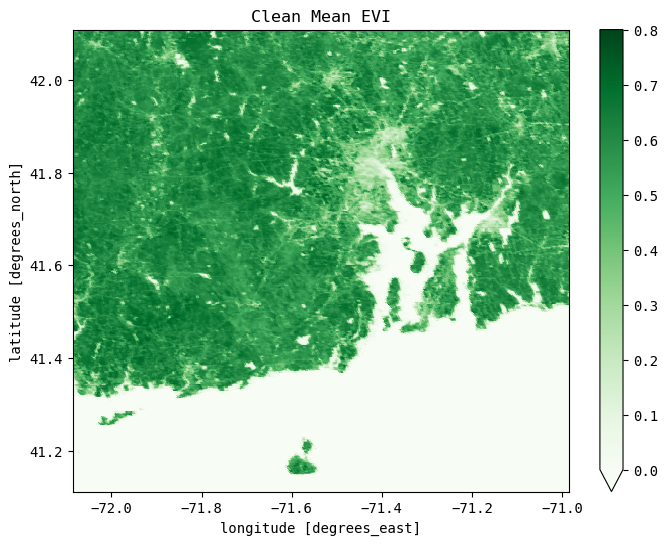

In [124]:
###another vegeation aspect ... theres a couple so need to loop
evi_folder = "/Users/emmawit/Downloads/EVI_Summer"
files = sorted(glob.glob(evi_folder + "/EVI_*.tif"))

cleaned = []

for f in files:
    arr = rxr.open_rasterio(f, masked=True).squeeze()

    arr = arr.where((arr >= -0.1) & (arr <= 1.0)) 

    cleaned.append(arr)

aligned = [c.rio.reproject_match(cleaned[0]) for c in cleaned]

stack = xr.concat(aligned, dim="time")
evi_mean_clean = stack.mean(dim="time", skipna=True)

out = evi_folder + "/evi_mean_clean.tif"

#######
plt.figure(figsize=(8,6))
evi_mean_clean.plot(cmap="Greens", vmin=0, vmax=0.8)
plt.title("Clean Mean EVI")
plt.show()

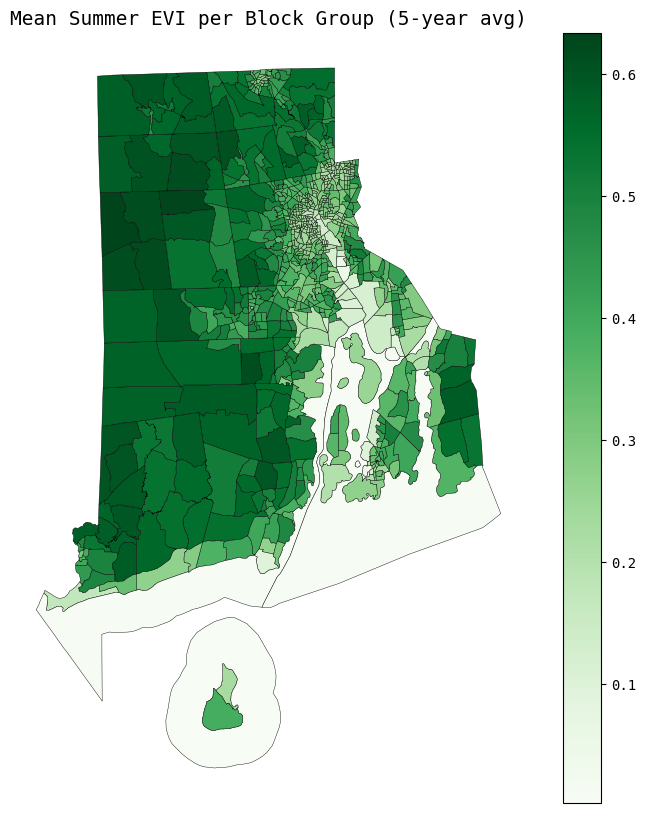

In [125]:
###now to calculate mean per block
evi_path = "/Users/emmawit/Downloads/EVI_Summer/evi_mean_clean.tif"
with rasterio.open(evi_path) as src:
    bounds = src.bounds
    ras_crs = src.crs

ri_acs = ri_acs.to_crs(ras_crs)

raster_box = box(bounds.left, bounds.bottom, bounds.right, bounds.top)
ri_acs_clip = ri_acs[ri_acs.intersects(raster_box)].copy() 

zs_evi = zonal_stats(
    ri_acs_clip,
    evi_path,
    stats=["mean"],
    all_touched=True,
    geojson_out=False
)
ri_acs_clip["evi_mean_5yr"] = [z["mean"] for z in zs_evi]


##plot
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

ri_acs_clip.plot(column="evi_mean_5yr", ax=ax, cmap="Greens", legend=True, edgecolor="black", linewidth=0.3)

ax.set_title("Mean Summer EVI per Block Group (5-year avg)", fontsize=14)
ax.set_axis_off()

plt.show()

In [126]:
# Ensure CRS matches
ri_acs = ri_acs.to_crs(ras_crs)

# Zonal stats for tmean
zs_tmean = zonal_stats(
    ri_acs,
    "/Users/emmawit/Downloads/Daymet_Summer_v2/daymet_mean_5yrs.tif",
    stats=["mean"],
    all_touched=True,
    geojson_out=False
)
ri_acs["tmean_5yr"] = [z["mean"] for z in zs_tmean]

# Zonal stats for tmean_mode
zs_mode = zonal_stats(
    ri_acs,
    "/Users/emmawit/Downloads/Daymet_Avg/daymet_tmean_mode.tif",
    stats=["mean"],
    all_touched=True,
    geojson_out=False
)
ri_acs["tmean_mode"] = [z["mean"] for z in zs_mode]

# Zonal stats for pct_nongreen (example, assuming you already have this calculation)
ri_acs["pct_nongreen"] = pct_nongreen  

ri_acs["pct_lc24"] = pct_lc24  

ri_acs["treecanopy_avg"] = zs # make sure this list matches ri_acs in length

# Make sure both columns exist in ri_acs
ri_acs["heat_exposure"] = ri_acs["tmean_5yr"] - ri_acs["tmean_mode"]

# Export all together
ri_acs.to_csv("/Users/emmawit/Downloads/ri_acs_all_vars.csv", index=False)

#### Going to export all the variables. For some reason, some were not showing up in the DF so I had to just recompute them. 

In [127]:
##ensuring the crs match
ri_acs = ri_acs.to_crs(ras_crs)

##redoing mean...
zs_tmean = zonal_stats(
    ri_acs,
    "/Users/emmawit/Downloads/Daymet_Summer_v2/daymet_mean_5yrs.tif",
    stats=["mean"],
    all_touched=True,
    geojson_out=False
)
ri_acs["tmean_5yr"] = [z["mean"] for z in zs_tmean]

##redoing mode ...
zs_mode = zonal_stats(
    ri_acs,
    "/Users/emmawit/Downloads/Daymet_Avg/daymet_tmean_mode.tif",
    stats=["mean"],
    all_touched=True,
    geojson_out=False
)
ri_acs["tmean_mode"] = [z["mean"] for z in zs_mode]


ri_acs["heat_exposure"] = ri_acs["tmean_5yr"] - ri_acs["tmean_mode"]

##adding all the landcover variables
ri_acs["pct_nongreen"] = pct_nongreen  
ri_acs["pct_lc24"] = pct_lc24  
ri_acs["treecanopy_avg"] = [z["mean"] for z in zs]
ri_acs["impervious_avg"] = [z["mean"] for z in s]

##this is the csv export 
#ri_acs.to_csv("/Users/emmawit/Downloads/ri_acs_all_vars2.csv", index=False)

In [128]:
###block groups that dont have people .... excluding them after noticing 
exclude_geoids = [
    "440039800001",
    "440050402002",
    "440050411001",
    "440099901000",
    "440099902000",
    "440059900000",
    "440050401051"
]

ri_acs_filtered = ri_acs[~ri_acs["GEOID"].isin(exclude_geoids)].copy()

#VARIABLES THAT WILL BE USED IN THE PCA ANALYSIS 
vars_for_pca = [
    "pct_latino", "pct_black", "pct_poverty", "pct_live_alone",
    "pct_live_alone_elderly", "pct_total_housing", "pct_less_hs",
    "pct_elderly", "pct_limited_english",
    "pct_pre1980", "dia_pct_total", "impervious_avg", "treecanopy_avg",
    "heat_exposure", "pct_lc24"
]

df = ri_acs_filtered[vars_for_pca].copy()

In [129]:
df_clean = df.dropna(axis=0, how="any")

In [130]:
summary_table = df_clean.agg(['min', 'max', 'mean', 'std']).transpose()  # transpose for nicer formatting
summary_table = summary_table.rename(columns={
    'min': 'Minimum',
    'max': 'Maximum',
    'mean': 'Mean',
    'std': 'StdDev'
})

print(summary_table)

##can export to csv to make tables, etc. 
##summary_table.to_csv("/Users/emmawit/Downloads/ri_acs_var_summary.csv")

                         Minimum     Maximum       Mean     StdDev
pct_latino              0.000000  100.000000  17.205761  22.027072
pct_black               0.000000   66.063978   5.406576   9.162741
pct_poverty             0.000000   25.870647   3.183246   3.705025
pct_live_alone          0.000000   64.627151  13.435575  10.078569
pct_live_alone_elderly  0.000000   50.877193   5.905599   5.942792
pct_total_housing       4.041889  435.955056  48.006362  23.686368
pct_less_hs             0.000000   45.086705   8.012193   8.221849
pct_elderly             0.000000  100.000000  19.063689  11.348709
pct_limited_english     0.000000   39.735099   2.313214   4.295958
pct_pre1980             0.000000  100.000000  51.702707  22.122429
dia_pct_total           6.469378   10.448511   8.985375   1.269592
impervious_avg          0.966574   85.546763  41.958838  24.934645
treecanopy_avg          1.520458   76.510045  28.630659  18.764400
heat_exposure          -0.478204   31.438513  27.101397   5.12

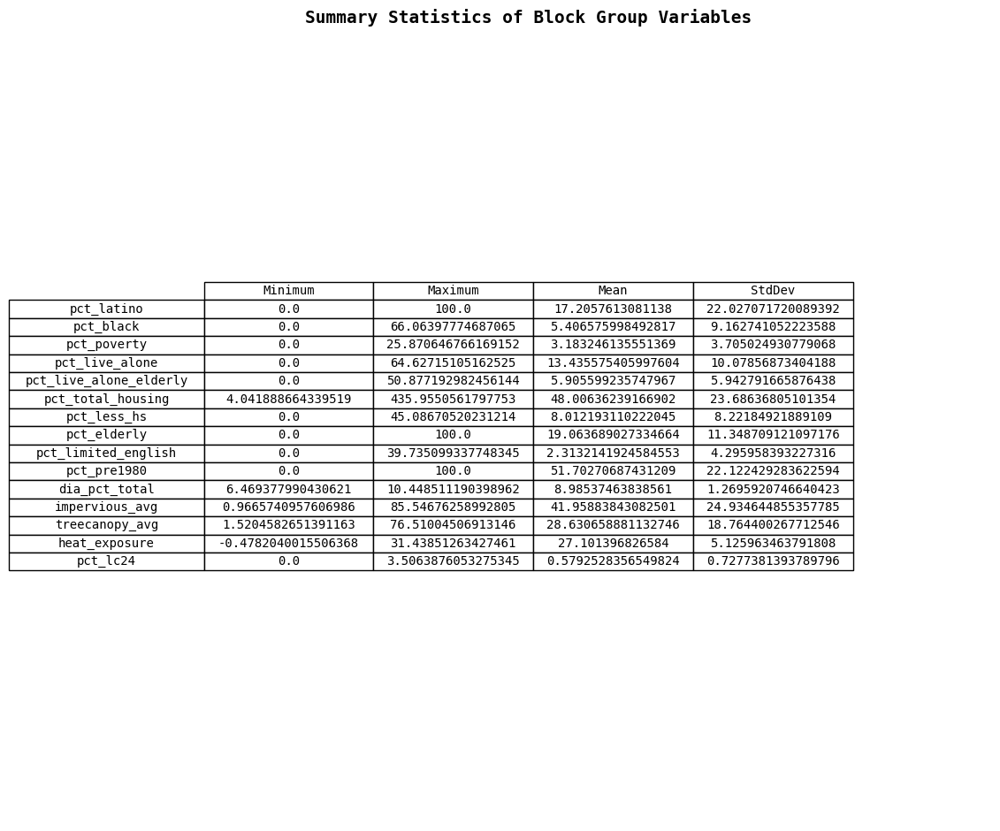

In [131]:
##or just make a table this way
fig, ax = plt.subplots(figsize=(12, len(summary_table)*0.5 + 2))
ax.axis('off')  

mpl_table = ax.table(
    cellText=summary_table.values,
    rowLabels=summary_table.index,
    colLabels=summary_table.columns,
    cellLoc='center',
    rowLoc='center',
    loc='center'
)

mpl_table.auto_set_font_size(False)
mpl_table.set_fontsize(10)
mpl_table.auto_set_column_width(col=list(range(len(summary_table.columns))))

plt.title("Summary Statistics of Block Group Variables", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [132]:
##compute the corrlations
corr = df_clean.corr(method="spearman")
corr

,pct_latino,pct_black,pct_poverty,pct_live_alone,pct_live_alone_elderly,pct_total_housing,pct_less_hs,pct_elderly,pct_limited_english,pct_pre1980,dia_pct_total,impervious_avg,treecanopy_avg,heat_exposure,pct_lc24
pct_latino,1.000000,0.404288,0.146605,-0.052727,-0.212316,-0.179508,0.452497,-0.441115,0.489148,-0.272786,0.376309,0.617094,-0.498175,0.276055,0.600545
pct_black,0.404288,1.000000,0.104237,0.087553,-0.054041,-0.048935,0.301989,-0.234430,0.352265,-0.168427,0.289671,0.513486,-0.444883,0.231286,0.475239
pct_poverty,0.146605,0.104237,1.000000,0.037357,-0.005891,-0.008728,0.124708,-0.075143,0.062301,-0.138853,0.038867,0.169845,-0.147218,0.058062,0.193087
pct_live_alone,-0.052727,0.087553,0.037357,1.000000,0.721508,0.729117,0.095686,0.373556,0.113913,-0.006071,-0.079389,0.169521,-0.188862,0.021001,0.234627
pct_live_alone_elderly,-0.212316,-0.054041,-0.005891,0.721508,1.000000,0.548102,0.030249,0.626005,0.025110,0.193900,-0.215765,-0.070947,0.009772,-0.049596,-0.023623
pct_total_housing,-0.179508,-0.048935,-0.008728,0.729117,0.548102,1.000000,-0.009516,0.447042,-0.023951,-0.046851,-0.199447,0.038177,-0.130572,-0.072540,0.091441
pct_less_hs,0.452497,0.301989,0.124708,0.095686,0.030249,-0.009516,1.000000,-0.069676,0.475052,-0.122720,0.316476,0.462840,-0.367956,0.271178,0.490312
pct_elderly,-0.441115,-0.234430,-0.075143,0.373556,0.626005,0.447042,-0.069676,1.000000,-0.146354,0.296899,-0.308927,-0.378764,0.262374,-0.153503,-0.344009
pct_limited_english,0.489148,0.352265,0.062301,0.113913,0.025110,-0.023951,0.475052,-0.146354,1.000000,-0.174317,0.264134,0.500963,-0.418952,0.236027,0.488242
pct_pre1980,-0.272786,-0.168427,-0.138853,-0.006071,0.193900,-0.046851,-0.122720,0.296899,-0.174317,1.000000,-0.106175,-0.337053,0.371630,-0.069139,-0.354905


In [133]:
##just part of the methods from Yale
scaler = StandardScaler()
X_std = scaler.fit_transform(df_clean)

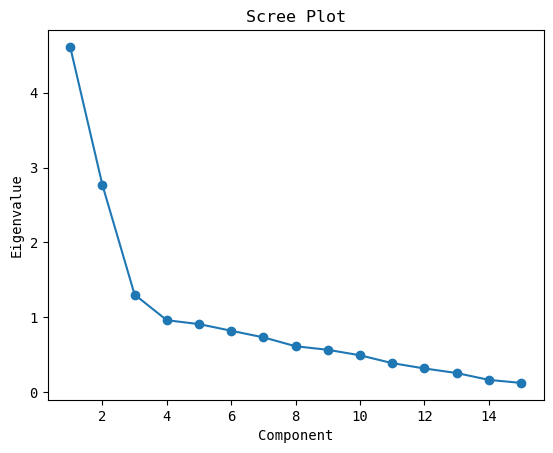

In [134]:
##just part of the methods from Yale ... Prinicipal Component analysis 
pca = PCA()
pca.fit(X_std)

eigenvalues = pca.explained_variance_
variance_ratio = pca.explained_variance_ratio_
cumvar = np.cumsum(variance_ratio)

plt.plot(range(1, len(eigenvalues)+1), eigenvalues, marker="o")
plt.xlabel("Component")
plt.ylabel("Eigenvalue")
plt.title("Scree Plot")
plt.show()

In [135]:
##just part of the methods from Yale ... figuring out our 'bins' ... smaller bc smaller sample size / variables
n_components = sum(eigenvalues > 1)
print("Retaining:", n_components)

Retaining: 3


In [136]:
##just a check for above
for i, v in enumerate(cumvar):
    print(f"PC {i+1}: {v:.3f}")

PC 1: 0.307
PC 2: 0.491
PC 3: 0.578
PC 4: 0.642
PC 5: 0.703
PC 6: 0.757
PC 7: 0.806
PC 8: 0.847
PC 9: 0.884
PC 10: 0.917
PC 11: 0.943
PC 12: 0.964
PC 13: 0.981
PC 14: 0.992
PC 15: 1.000


In [142]:
##just part of the methods from Yale ... 
loadings = pca.components_.T[:, :n_components]
loading_df = pd.DataFrame(loadings, index=vars_for_pca,
                          columns=[f"PC{i+1}" for i in range(n_components)])
##see them 
print(loading_df)

                             PC1       PC2       PC3
pct_latino              0.356579 -0.105671  0.066597
pct_black               0.260642  0.008785  0.003294
pct_poverty             0.129147 -0.017507 -0.203226
pct_live_alone          0.076324  0.500923  0.006325
pct_live_alone_elderly -0.016173  0.541280  0.108905
pct_total_housing      -0.041610  0.425392 -0.263923
pct_less_hs             0.310353  0.138732  0.261647
pct_elderly            -0.186933  0.437736  0.090382
pct_limited_english     0.302212  0.131426  0.206461
pct_pre1980            -0.214866  0.069088  0.386514
dia_pct_total           0.254919 -0.119128  0.362869
impervious_avg          0.416263  0.015407 -0.043217
treecanopy_avg         -0.349798 -0.109285  0.233141
heat_exposure           0.022551  0.005096  0.627034
pct_lc24                0.387983  0.065423 -0.151597


In [143]:
##next step in the methods ... https://stackoverflow.com/questions/17628589/perform-varimax-rotation-in-python-using-numpy used for guide on how to perform this
def varimax(Phi, gamma=1.0, q=20, tol=1e-6):
    p, k = Phi.shape
    R = np.eye(k)
    d = 0
    for i in range(q):
        d_old = d
        Lambda = np.dot(Phi, R)
        u, s, vh = np.linalg.svd(
            np.dot(Phi.T, np.asarray(Lambda)**3 - 
                   (gamma/p) * np.dot(Lambda, np.diag(np.diag(np.dot(Lambda.T, Lambda)))))
        )
        R = np.dot(u, vh)
        d = np.sum(s)
        if d_old != 0 and d/d_old < 1 + tol:
            break
    return np.dot(Phi, R)

# Apply varimax to retained components
loadings_rot = varimax(loadings)
loadings_rot_df = pd.DataFrame(loadings_rot, index=vars_for_pca,
                               columns=[f"Factor{i+1}" for i in range(n_components)])

print(loadings_rot_df)

                         Factor1   Factor2   Factor3
pct_latino              0.338398 -0.128053  0.108810
pct_black               0.258696 -0.009675  0.031702
pct_poverty             0.148565 -0.034761 -0.187100
pct_live_alone          0.112627  0.494068 -0.001304
pct_live_alone_elderly  0.012933  0.544973  0.089121
pct_total_housing       0.019090  0.416396 -0.280348
pct_less_hs             0.289967  0.126614  0.289677
pct_elderly            -0.162140  0.453197  0.055218
pct_limited_english     0.287281  0.117709  0.234191
pct_pre1980            -0.249372  0.099594  0.358090
dia_pct_total           0.204753 -0.122395  0.392359
impervious_avg          0.418471 -0.016015  0.002429
treecanopy_avg         -0.380054 -0.074698  0.196561
heat_exposure          -0.044674  0.028512  0.625218
pct_lc24                0.405845  0.031519 -0.109949


In [144]:
##calculating the pc stores
scores = np.dot(X_std, pca.components_.T[:, :n_components])

rot_scores = np.dot(X_std, loadings_rot)

scores_df = pd.DataFrame(rot_scores, columns=[f"Factor{i+1}" for i in range(n_components)])
ri_acs = pd.concat([ri_acs, scores_df], axis=1)

In [ ]:
##NOW RESCALING THE FACTORS
for f in scores_df.columns:
    scores_df[f"{f}_scaled"] = pd.qcut(
        scores_df[f],
        q=6,
        labels=[1, 2, 3, 4, 5, 6]
    )

scaled_cols = [f"{f}_scaled" for f in scores_df.columns if f"{f}_scaled" in scores_df.columns]

scores_df["HVI"] = scores_df[scaled_cols].astype(float).sum(axis=1)

ri_acs_hvi = ri_acs.merge(scores_df, left_index=True, right_index=True, how='left')

###export into csv I wanted
#ri_acs_hvi.to_csv("/Users/emmawit/Downloads/ri_acs_hvi.csv", index=False)

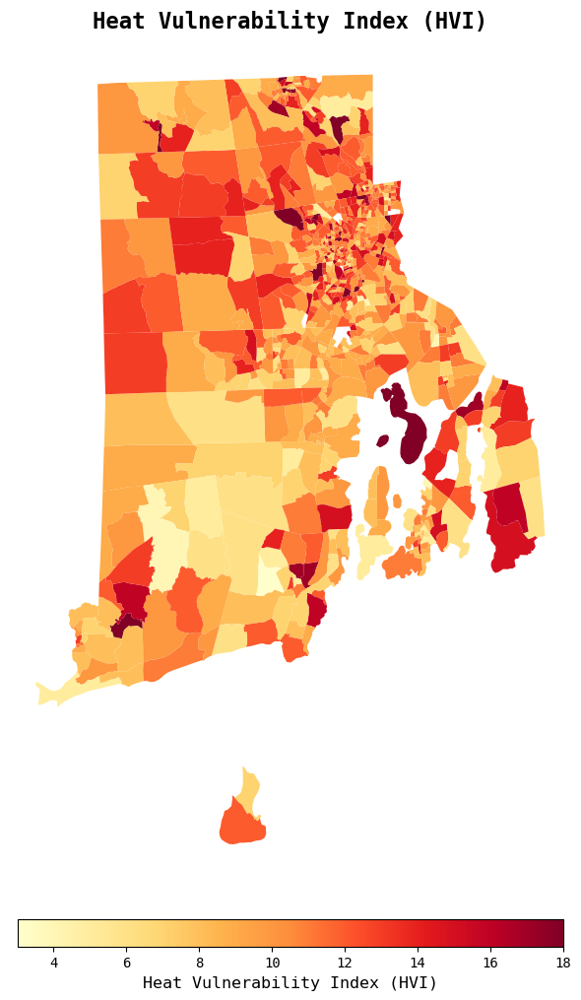

In [149]:
exclude_geoids = [
    "440039800001",
    "440050402002",
    "440050411001",
    "440099901000",
    "440099902000",
    "440059900000",
    "440050401051"
]

ri_acs_hvi_plot = ri_acs_hvi[~ri_acs_hvi["GEOID"].isin(exclude_geoids)]

################

plt.rcParams.update({
    "font.family": "monospace",
    "axes.titleweight": "bold"
})

fig, ax = plt.subplots(1, 1, figsize=(12, 12))
ri_acs_hvi_plot.plot(
    column="HVI",
    ax=ax,
    cmap="YlOrRd",
    edgecolor="none",
    linewidth=0.2,
    legend=False
)

# Create a custom horizontal colorbar
sm = plt.cm.ScalarMappable(cmap="YlOrRd", norm=mpl.colors.Normalize(
    vmin=ri_acs_hvi_plot["HVI"].min(),
    vmax=ri_acs_hvi_plot["HVI"].max()
))
sm._A = []

cbar = fig.colorbar(
    sm,
    ax=ax,
    orientation="horizontal",
    fraction=0.03,
    pad=0.04
)
cbar.set_label("Heat Vulnerability Index (HVI)", fontsize=12)

ax.set_title("Heat Vulnerability Index (HVI)", fontsize=16)
ax.set_axis_off()
#plt.savefig("/Users/emmawit/Downloads/HVI_map2.png", dpi=300, bbox_inches='tight')

plt.show()

In [150]:
###getting some metrics
ri_acs_hvi_plot['HVI'].describe()

hvi_stats = {
    "min": ri_acs_hvi_plot['HVI'].min(),
    "max": ri_acs_hvi_plot['HVI'].max(),
    "mean": ri_acs_hvi_plot['HVI'].mean(),
    "std": ri_acs_hvi_plot['HVI'].std()
}

print(hvi_stats)

{'min': 3.0, 'max': 18.0, 'mean': np.float64(10.505791505791505), 'std': 2.9711291065543337}


In [153]:
##there are some duplicate columns so need 
ri_acs_hvi_plot = ri_acs_hvi_plot.loc[:,~ri_acs_hvi_plot.columns.duplicated()]

ri_acs_hvi_plot = ri_acs_hvi_plot.to_crs(epsg=4326)

###just for safe measures, exclude them again 
exclude_geoids = [
    "440039800001",
    "440050402002",
    "440050411001",
    "440099901000",
    "440099902000",
    "440059900000",
    "440050401051"
]
ri_acs_hvi_plot = ri_acs_hvi_plot[~ri_acs_hvi_plot["GEOID"].isin(exclude_geoids)]

ri_acs_hvi_plot["HVI"] = ri_acs_hvi_plot["HVI"].fillna(0)

colormap = cm.LinearColormap(
    colors=["yellow", "orange", "red"],
    vmin=ri_acs_hvi_plot["HVI"].min(),
    vmax=ri_acs_hvi_plot["HVI"].max(),
    caption="Heat Vulnerability Index"
)

###ZOOM TO JUST RHODE ISLAND
m = folium.Map(location=[41.7, -71.5], zoom_start=9, tiles="cartodbpositron")

def style_function(feature):
    hvi = feature["properties"]["HVI"]
    return {
        "fillColor": colormap(hvi) if hvi is not None else "#ffffff",
        "color": "black",
        "weight": 0.2,
        "fillOpacity": 0.7
    }

folium.GeoJson(
    ri_acs_hvi_plot,
    style_function=style_function,
    tooltip=GeoJsonTooltip(
        fields=["GEOID", "HVI"],
        aliases=["GEOID:", "HVI Score:"],
        localize=True
    )
).add_to(m)

colormap.add_to(m)
folium.LayerControl().add_to(m)
m

#### ADI Data

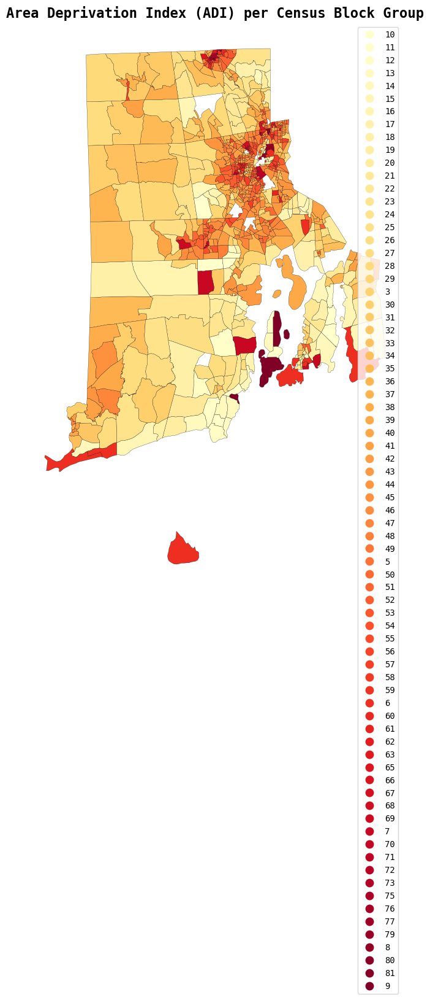

In [154]:
##LOAD IN ADI DATA
adi_csv = pd.read_csv("/Users/emmawit/Downloads/adi-download/RI_2023_ADI_Census_Block_Group_v4_0_1.csv")

adi_csv["FIPS"] = adi_csv["FIPS"].astype(str)
ri_acs_hvi_plot["GEOID"] = ri_acs_hvi_plot["GEOID"].astype(str)

##join the two
ri_acs_hvi_adi = ri_acs_hvi_plot.merge(adi_csv, left_on="GEOID", right_on="FIPS", how="left")

##some random non numerical values
exclude_adi = ["GQ", "GQ-PH", "PH", "QDI"]

ri_acs_hvi_adi_plot = ri_acs_hvi_adi[~ri_acs_hvi_adi["ADI_NATRANK"].isin(exclude_adi)]

####

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ri_acs_hvi_adi_plot.plot(
    column="ADI_NATRANK",
    ax=ax,
    cmap="YlOrRd",
    legend=True,
    edgecolor="black",
    linewidth=0.2
)

ax.set_title("Area Deprivation Index (ADI) per Census Block Group", fontsize=16)
ax.set_axis_off()
plt.show()

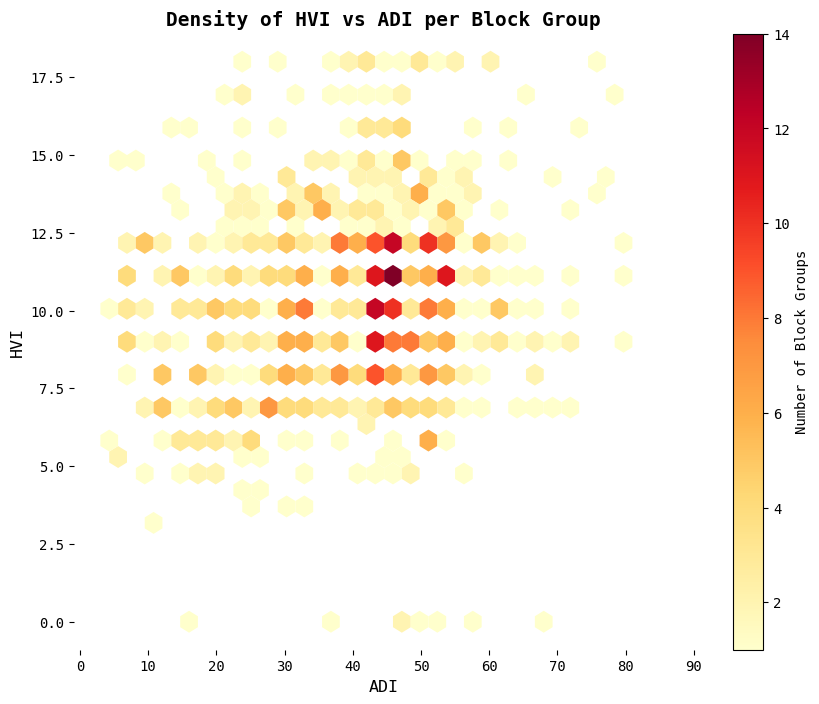

In [156]:
###so numbers where string, so need to convert them to numeric ... 
ri_acs_hvi_adi_plot['ADI_NATRANK'] = pd.to_numeric(
    ri_acs_hvi_adi_plot['ADI_NATRANK'], errors='coerce'
)

plt.figure(figsize=(10,8))

plt.rcParams.update({'font.family': 'monospace'})

hb = plt.hexbin(
    ri_acs_hvi_adi_plot['ADI_NATRANK'],
    ri_acs_hvi_adi_plot['HVI'],
    gridsize=30,
    cmap='YlOrRd',
    mincnt=1,
    edgecolors='none'  
)

cb = plt.colorbar(hb, label='Number of Block Groups')
cb.ax.yaxis.set_tick_params(labelsize=10)

plt.xticks(np.arange(0, int(ri_acs_hvi_adi_plot['ADI_NATRANK'].max())+10, 10))

plt.xlabel("ADI", fontsize=12)
plt.ylabel("HVI", fontsize=12)
plt.title("Density of HVI vs ADI per Block Group", fontsize=14)

for spine in plt.gca().spines.values():
    spine.set_visible(False)

#plt.savefig("hvi_vs_adi_hexbin.png", dpi=300, bbox_inches='tight')
plt.show()

In [157]:
##calculating the correlation b/w them two
ri_acs_hvi_adi_plot['ADI_NATRANK'] = pd.to_numeric(ri_acs_hvi_adi_plot['ADI_NATRANK'], errors='coerce')
ri_acs_hvi_adi_plot['HVI'] = pd.to_numeric(ri_acs_hvi_adi_plot['HVI'], errors='coerce')

df_corr = ri_acs_hvi_adi_plot.dropna(subset=['ADI_NATRANK', 'HVI'])
corr = df_corr['ADI_NATRANK'].corr(df_corr['HVI'])
print("Pearson correlation between ADI and HVI:", corr)

Pearson correlation between ADI and HVI: 0.1580117003778138


### Seeing the HVI values for just Providence

<Axes: >

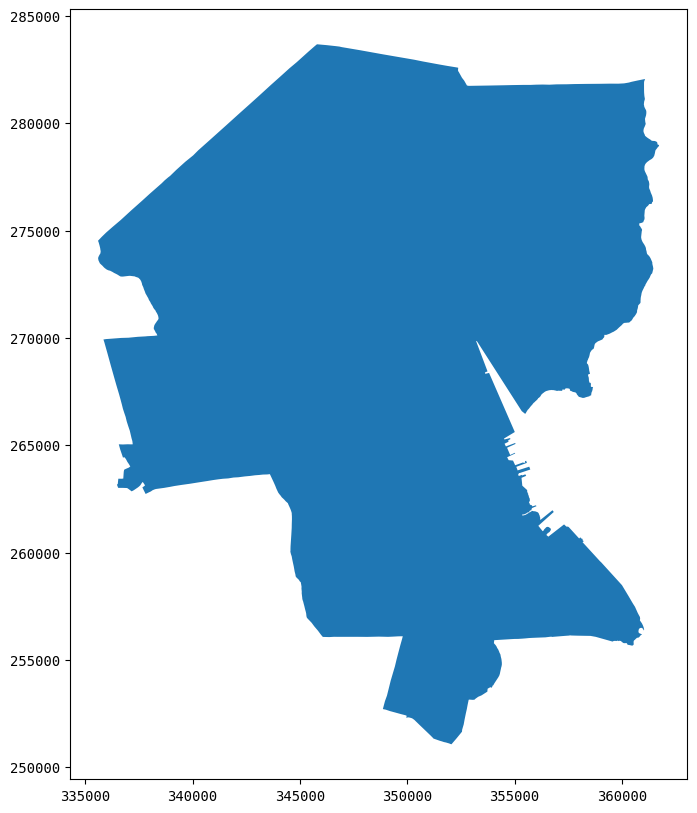

In [158]:
prov_boundary = gpd.read_file("/Users/emmawit/Downloads/PVD_Boundary 2/PVD_Boundary.shp")

prov_boundary.plot(legend=True, figsize=(10,10))

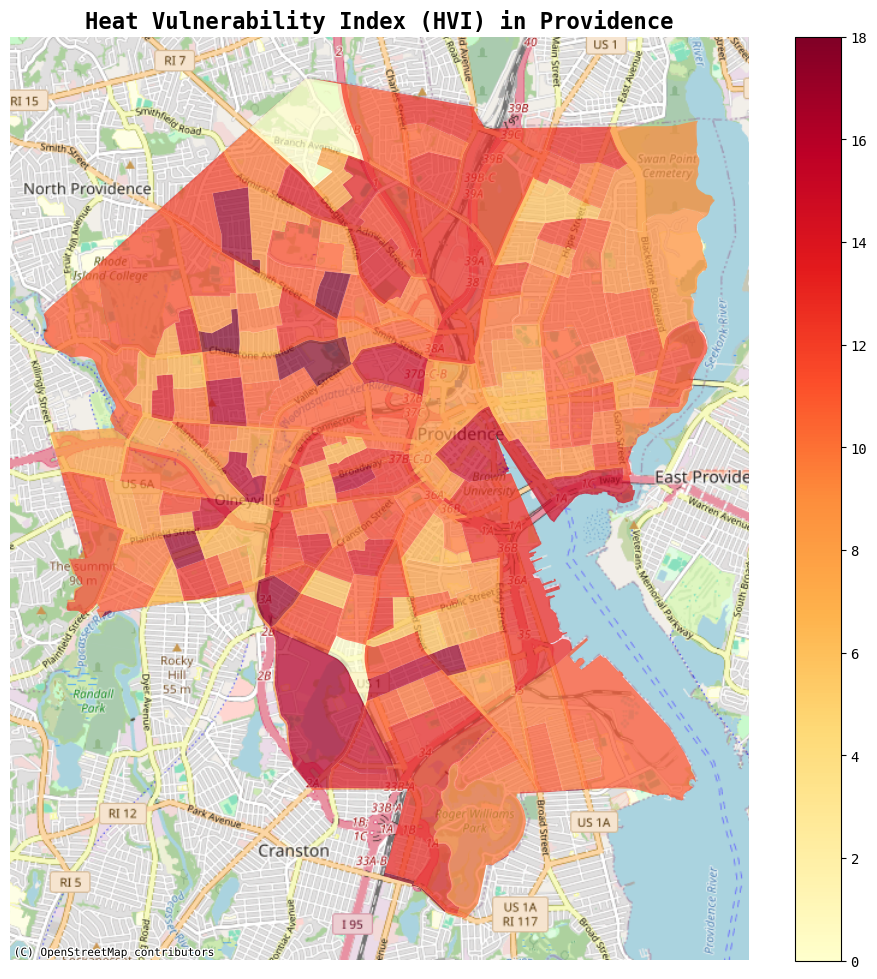

In [ ]:
##for for visualization purpose, clip hvi to prov boundary
ri_acs_hvi_plot = ri_acs_hvi_plot.to_crs(prov_boundary.crs)

ri_acs_hvi_prov = gpd.clip(ri_acs_hvi_plot, prov_boundary)

ri_acs_hvi_prov_web = ri_acs_hvi_prov.to_crs(epsg=3857)
prov_boundary_web = prov_boundary.to_crs(epsg=3857)

fig, ax = plt.subplots(1, 1, figsize=(12, 12))
ri_acs_hvi_prov_web.plot(
    column="HVI",
    ax=ax,
    cmap="YlOrRd",
    legend=True,
    edgecolor="none",
    linewidth=0.2,
    alpha=0.7
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title("Heat Vulnerability Index (HVI) in Providence", fontsize=16)
ax.set_axis_off()
plt.show()